# CEC-2017 Optimization Experiments

Reproducibility notebook for the research pipeline. Logic lives in `src/cec2017/`; this notebook orchestrates runs and showcases outputs.


## Stage 1 — 3D surface plots (f1–f10)

Unimodal CEC-2017 functions on a 2D slice over $[-100, 100]^2$ with a $50 \times 50$ grid.

Expected artifacts in `../outputs/stage1/`:
- `f1.png` … `f10.png` — static figures
- `cec_f1_f10.html` — interactive Plotly figure with a function dropdown

Also published on [GitHub Pages](https://lopa10ko.github.io/cec2017-optimization-research/cec_f1_f10.html).


In [5]:
from pathlib import Path

from cec2017.benchmark import CEC2017Benchmark
from cec2017.visualization import PlotlySurfacePlotter

POINTS = 50
DIMENSION = 2
OUTPUT_DIR = Path("../outputs/stage1")

REQUIRED_FILES = [f"f{i}.png" for i in range(1, 11)] + ["cec_f1_f10.html"]


def stage1_artifacts_complete(output_dir: Path) -> bool:
    """Return True if all Stage 1 PNG and HTML exports are present."""
    return all((output_dir / name).is_file() for name in REQUIRED_FILES)


plotter = PlotlySurfacePlotter(png_width=1200, png_height=900, png_scale=3)

if stage1_artifacts_complete(OUTPUT_DIR):
    print(f"Stage 1 artifacts already in {OUTPUT_DIR.resolve()}; skipping plot generation.")
else:
    missing = [n for n in REQUIRED_FILES if not (OUTPUT_DIR / n).is_file()]
    print(f"Missing in {OUTPUT_DIR.resolve()}: {', '.join(missing)}")
    OUTPUT_DIR.mkdir(parents=True, exist_ok=True)
    bench = CEC2017Benchmark()
    plotter.plot_all(
        bench.unimodal_functions(), OUTPUT_DIR, points=POINTS, dimension=DIMENSION
    )
    print("Plot generation finished.")


Missing in /Users/lopatenko/Desktop/itmo/cec2017-optimization-research/outputs/stage1: f1.png, f2.png, f3.png, f4.png, f5.png, f6.png, f7.png, f8.png, f9.png, f10.png, cec_f1_f10.html
Plot generation finished.


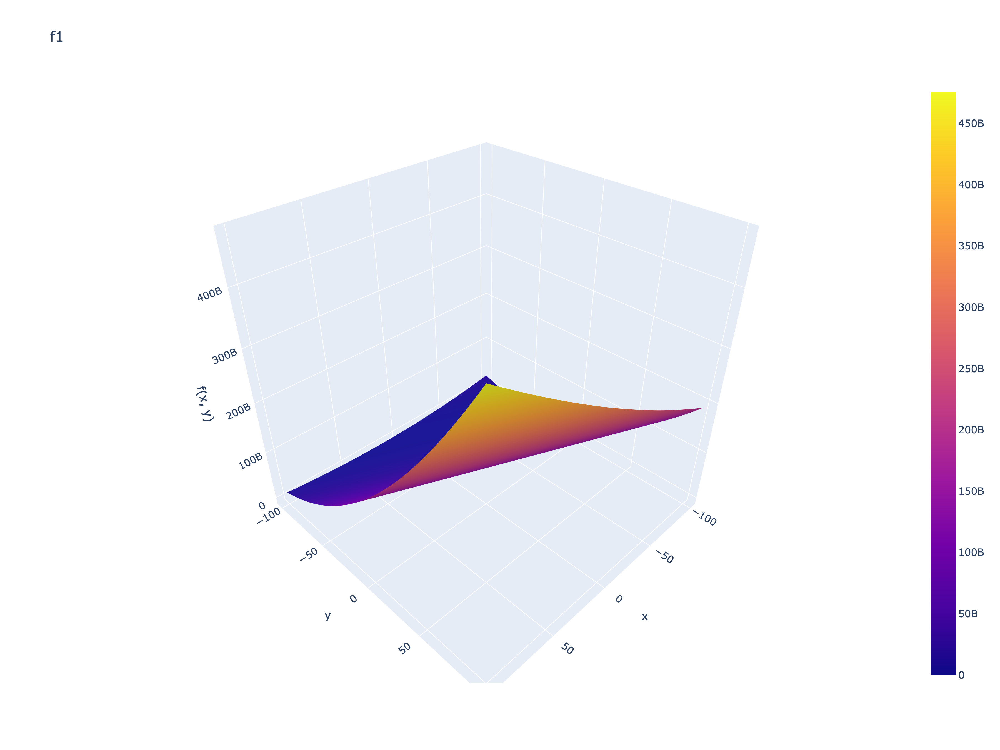

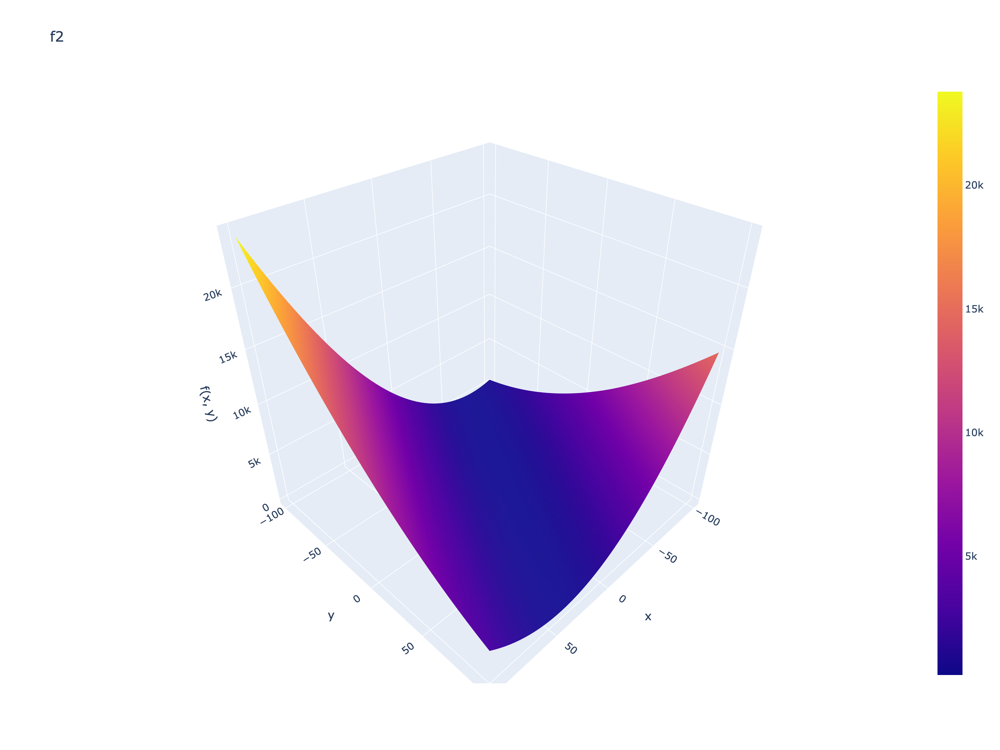

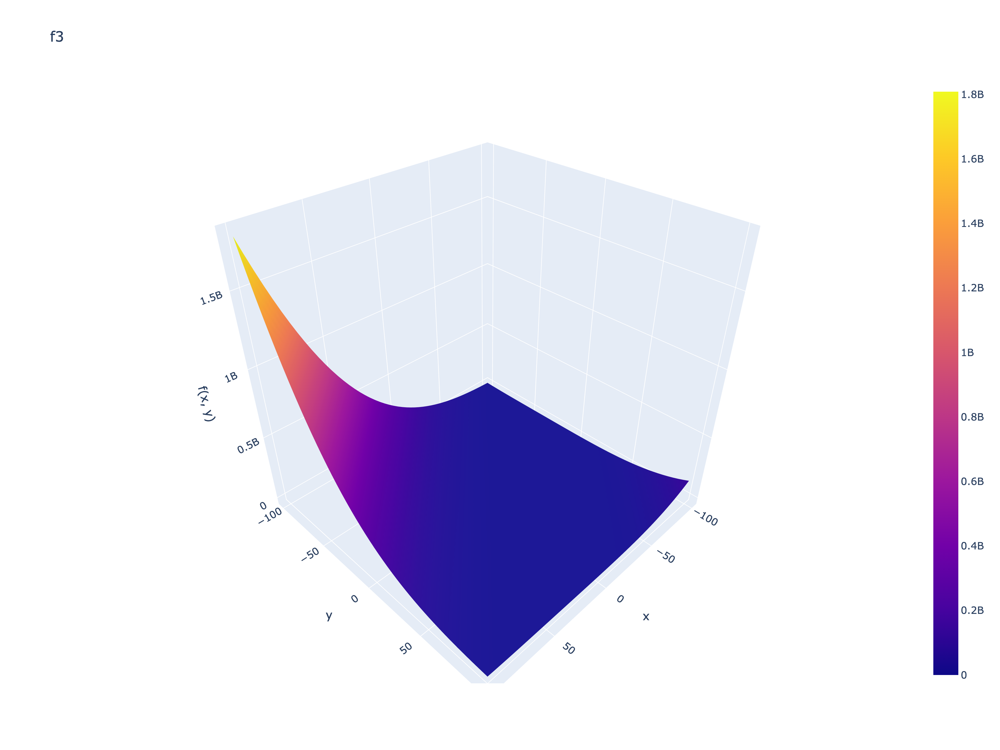

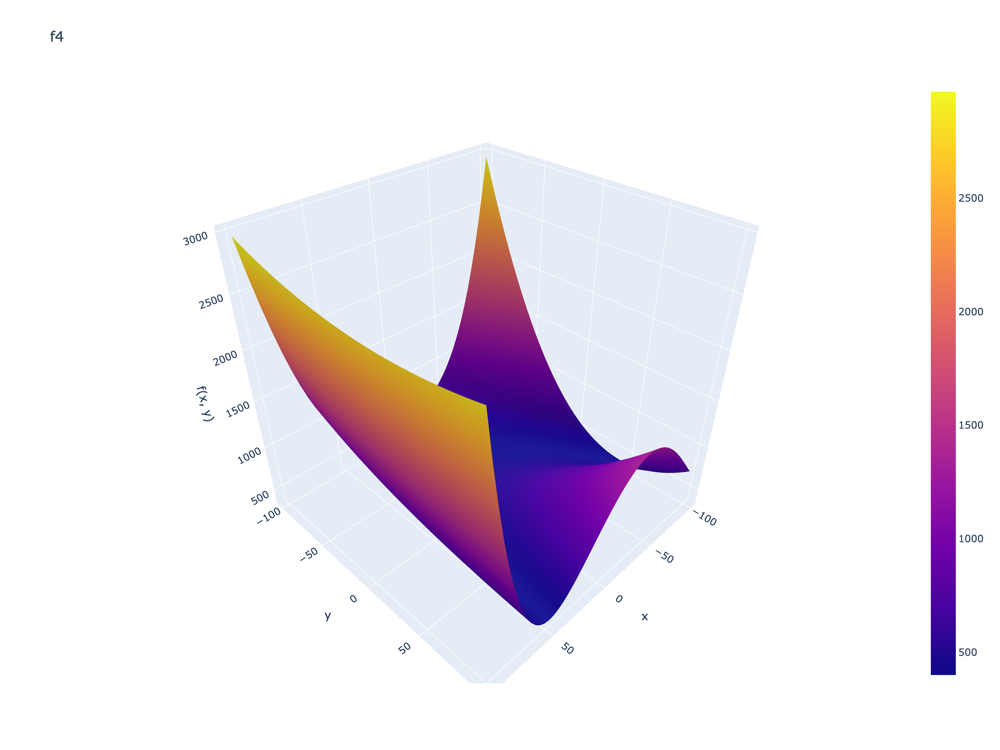

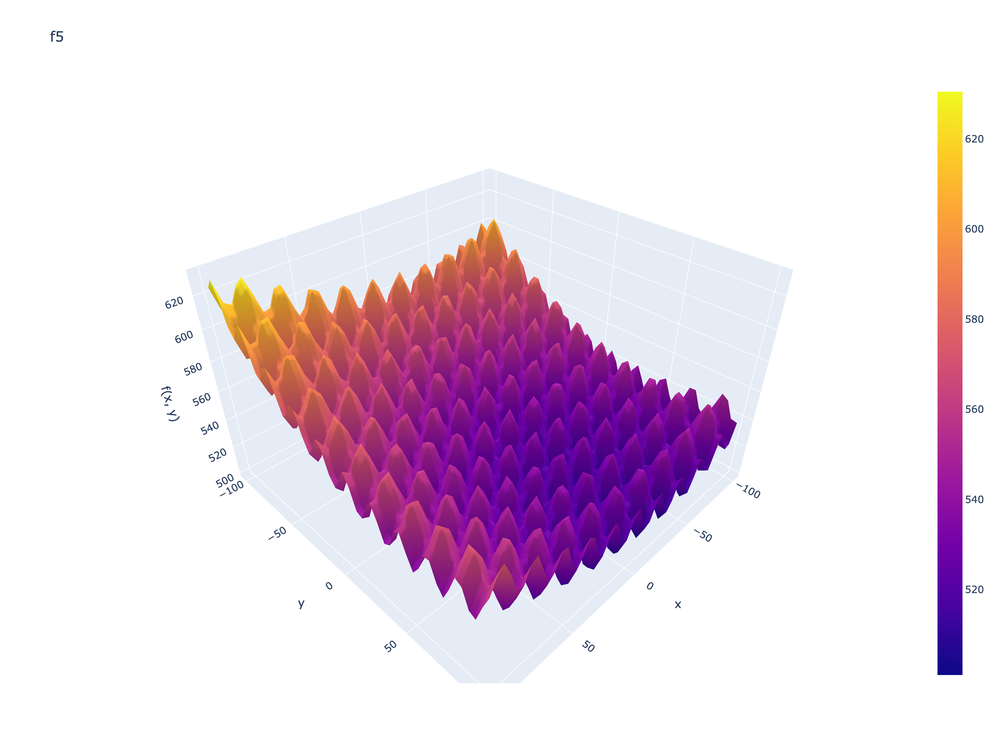

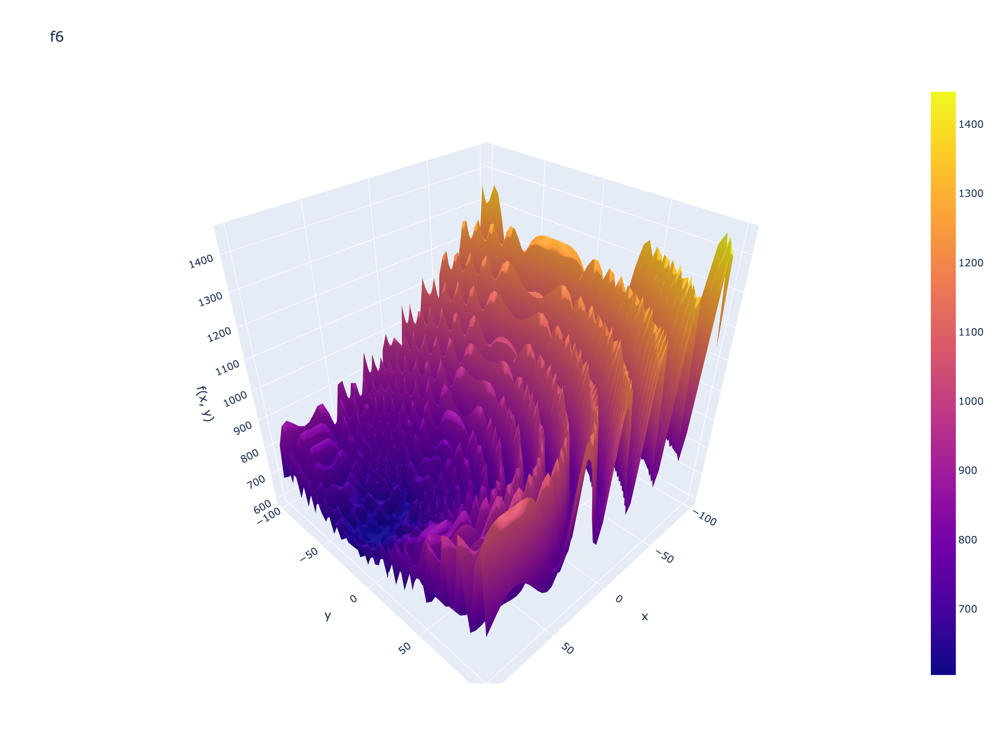

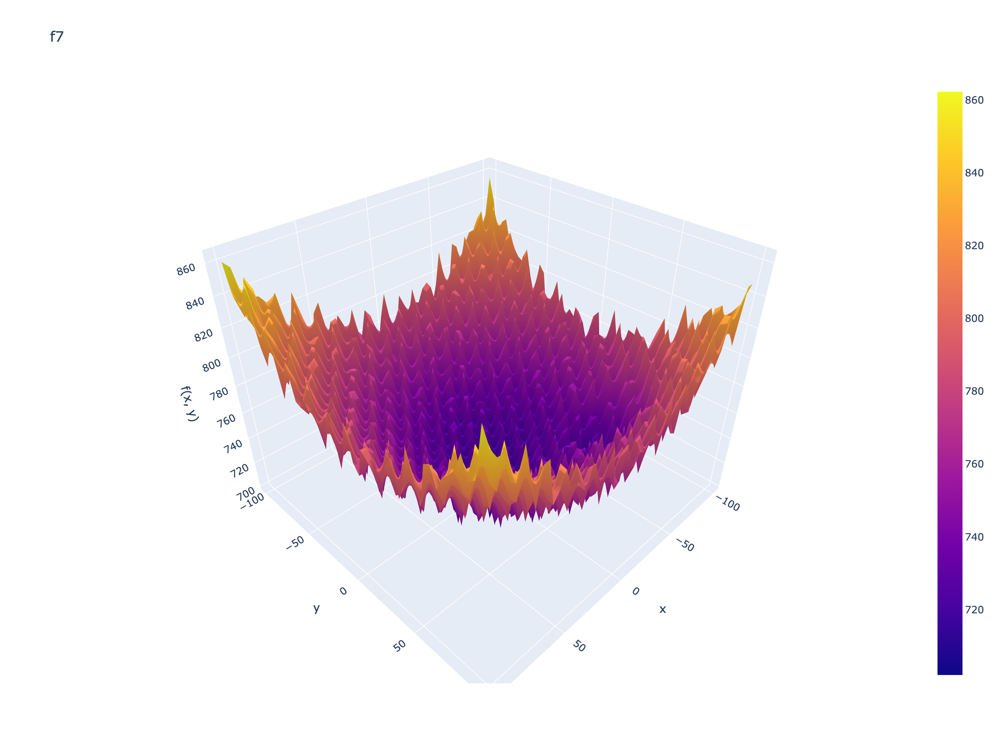

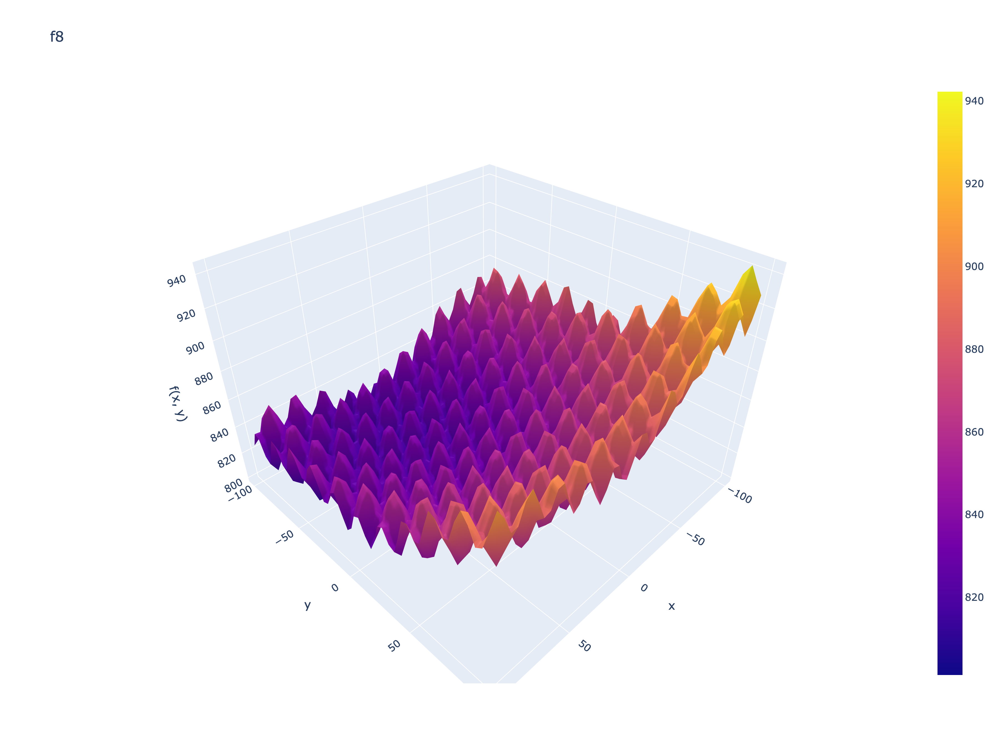

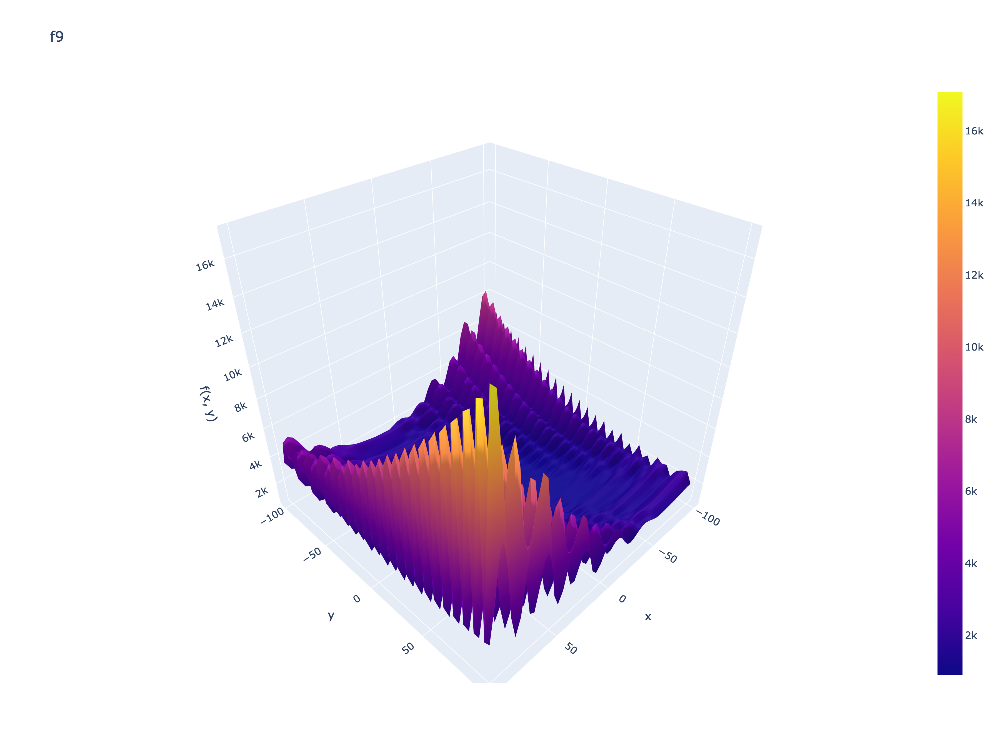

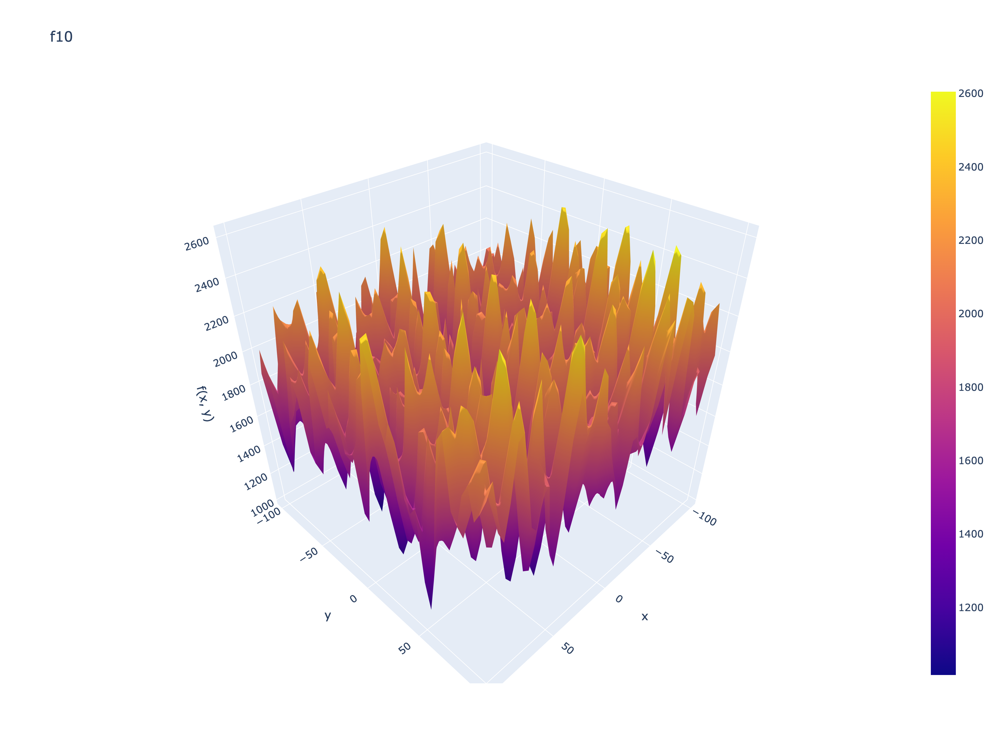

In [6]:
from IPython.display import Image, Markdown, display

assert stage1_artifacts_complete(OUTPUT_DIR), (
    f"Run the cell above first. Missing files in {OUTPUT_DIR.resolve()}"
)

for i in range(1, 11):
    name = f"f{i}"
    display(Image(filename=OUTPUT_DIR / f"{name}.png", width=512))


In [7]:
import base64

from IPython.display import HTML, Markdown, display

html_path = OUTPUT_DIR / "cec_f1_f10.html"
assert html_path.is_file(), f"Missing {html_path.resolve()}"

html_b64 = base64.b64encode(html_path.read_bytes()).decode("ascii")
display(
    HTML(
        f'<iframe src="data:text/html;base64,{html_b64}" '
        'width="1000" height="1000" style="border:none;"></iframe>'
    )
)


/Users/lopatenko/Desktop/itmo/cec2017-optimization-research/.venv/lib/python3.12/site-packages/IPython/core/display.py:447: UserWarning: Consider using IPython.display.IFrame instead
  warnings.warn("Consider using IPython.display.IFrame instead")


## Stage 2 — SciPy `minimize` (f1–f28, $D=10$)

Ten independent runs per function with random $x_0 \in [-100, 100]^{10}$. Outputs under `outputs/stage2/`:

- `scipy_fmin.csv`, `scipy_time.csv` — best objective and wall-clock time (seconds) per run × function
- `scipy_fmin_boxplot.html` / `.png`, `scipy_time_boxplot.html` / `.png` — Plotly boxplots across the 10 runs


In [8]:
from pathlib import Path

from cec2017.benchmark import CEC2017Benchmark
from cec2017.optimization import (
    ScipyMinimizeOptimizer,
    load_results_table,
    save_boxplots,
    save_fmin_log1p_plots,
    save_results_tables,
    stage2_scipy_complete,
)

STAGE2_DIR = Path("../outputs/stage2")
STAGE2_FMIN = STAGE2_DIR / "scipy_fmin.csv"
STAGE2_TIME = STAGE2_DIR / "scipy_time.csv"
DIMENSION = 10
N_RUNS = 10
BASE_SEED = 42

if stage2_scipy_complete(STAGE2_FMIN, STAGE2_TIME):
    print(f"Stage 2 tables already in {STAGE2_DIR.resolve()}; skipping optimization.")
else:
    bench = CEC2017Benchmark()
    optimizer = ScipyMinimizeOptimizer(maxiter=1000)
    fmin_df, time_df = optimizer.run_tables(
        bench.functions_range(1, 28),
        n_runs=N_RUNS,
        dimension=DIMENSION,
        base_seed=BASE_SEED,
    )
    save_results_tables(fmin_df, time_df, STAGE2_FMIN, STAGE2_TIME)
    print(f"Saved {STAGE2_FMIN.resolve()} and {STAGE2_TIME.resolve()}")

fmin_df = load_results_table(STAGE2_FMIN)
time_df = load_results_table(STAGE2_TIME)
save_boxplots(fmin_df, time_df, STAGE2_DIR, prefix="scipy")
save_fmin_log1p_plots(fmin_df, STAGE2_DIR, prefix="scipy")
print("Boxplots saved under", STAGE2_DIR.resolve())


Stage 2 tables already in /Users/lopatenko/Desktop/itmo/cec2017-optimization-research/outputs/stage2; skipping optimization.
Boxplots saved under /Users/lopatenko/Desktop/itmo/cec2017-optimization-research/outputs/stage2


In [9]:
import base64

from IPython.display import HTML, display

from cec2017.optimization import load_results_table, stage2_scipy_complete

assert stage2_scipy_complete(STAGE2_FMIN, STAGE2_TIME), "Run the Stage 2 cell above first."

display(load_results_table(STAGE2_FMIN))
display(load_results_table(STAGE2_TIME))

for label, path in (
    ("f_min", STAGE2_DIR / "scipy_fmin_boxplot.html"),
    ("runtime", STAGE2_DIR / "scipy_time_boxplot.html"),
):
    assert path.is_file(), f"Missing {path.resolve()}"
    html_b64 = base64.b64encode(path.read_bytes()).decode("ascii")
    display(HTML(f"<h4>SciPy {label}</h4>"))
    display(
        HTML(
            f'<iframe src="data:text/html;base64,{html_b64}" '
            'width="1500" height="1000" style="border:none;"></iframe>'
        )
    )


,f1,f2,f3,f4,f5,f6,f7,f8,f9,f10,...,f19,f20,f21,f22,f23,f24,f25,f26,f27,f28
run_1,100.000379,200.000913,300.000000,400.0,662.309297,704.618925,1442.928576,979.089115,10417.950091,2811.004816,...,2250.946872,2613.138983,2200.000013,4603.078527,2815.602766,2602.381791,2902.108534,4271.339251,3136.929557,3411.821666
run_2,100.000379,209.130580,300.000000,400.0,833.298638,700.738143,1200.989428,1029.830185,5090.297252,3338.449390,...,2839.134479,2522.215121,2481.890961,3749.064805,3041.137265,2919.297577,2898.928799,5149.370427,3258.008242,3383.733965
run_3,100.000379,200.000099,300.000001,400.0,802.453228,704.913214,1406.611579,956.206046,3220.945560,2664.817039,...,4085.008743,2689.828435,2411.471001,5534.068108,2824.008031,2872.199207,2949.637029,5228.790898,4743.522578,3383.733965
run_4,100.000374,200.000031,300.000000,400.0,836.283757,701.659529,1020.073248,886.560783,2678.240868,3459.275403,...,2685.320902,2577.087992,2352.791925,4977.842761,2750.213641,2789.066317,3559.353016,4734.272019,3173.406451,3383.745150
run_5,100.000379,200.000756,300.000000,400.0,599.862960,720.057609,1177.960149,943.272545,3000.640171,2538.519756,...,2184.130242,2261.758175,2532.412560,3071.758507,2982.798671,2897.602933,2901.173966,2800.000017,4200.683544,3100.000011
run_6,100.000378,200.000005,300.000000,400.0,645.261818,674.744128,957.330783,953.501307,5155.246366,2284.429173,...,2028.843042,2642.968308,2598.739571,3694.951592,2777.977053,2968.263393,2950.063518,4741.062114,3185.850406,3100.000010
run_7,100.000235,201.799670,300.000000,400.0,629.342303,730.884494,1598.288772,1005.946481,4583.187809,2732.472975,...,3865.596471,2578.552632,2385.110126,4461.335512,2886.892160,2813.558541,3024.369684,4554.930733,3101.915446,3411.821666
run_8,100.000178,200.000002,300.000000,400.0,887.013445,723.724224,871.598731,913.424303,3768.100781,2619.028096,...,1964.690768,2814.297333,2482.183638,4238.668071,3693.743610,2992.268153,2949.533224,4892.467547,3102.029111,3383.733965
run_9,100.000378,200.000139,300.000000,400.0,699.981535,691.634177,1931.072560,922.377027,1534.216877,2781.279625,...,3982.337550,2389.057640,2437.600171,4580.787501,4117.006011,2923.631734,2944.861434,4343.907802,3459.057421,3411.821666
run_10,100.000379,200.000005,300.000000,400.0,935.750863,686.022434,1395.246415,944.267338,7425.463525,2630.397270,...,1930.849340,2649.260061,2542.355766,2308.654887,2788.327916,2601.529941,2899.584968,5039.069502,3503.579685,3411.821666


,f1,f2,f3,f4,f5,f6,f7,f8,f9,f10,...,f19,f20,f21,f22,f23,f24,f25,f26,f27,f28
run_1,0.007722,0.032828,0.014754,0.013029,0.005280,0.012192,0.008067,0.004038,0.021027,0.006886,...,0.024044,0.108693,0.063962,0.035348,0.031637,0.046403,0.047980,0.035957,0.060087,0.046561
run_2,0.005526,0.022530,0.012602,0.014626,0.002310,0.018292,0.020781,0.002668,0.020996,0.006542,...,0.037119,0.085762,0.011070,0.019984,0.037990,0.017564,0.048856,0.042849,0.079780,0.057720
run_3,0.005848,0.028492,0.013078,0.013188,0.002911,0.009412,0.008919,0.002971,0.017650,0.003839,...,0.066314,0.084870,0.012417,0.012143,0.032911,0.020898,0.058063,0.024946,0.027742,0.043108
run_4,0.008253,0.037020,0.014811,0.014226,0.002773,0.007828,0.011859,0.002769,0.010948,0.004671,...,0.038164,0.095204,0.010726,0.050201,0.020265,0.015935,0.053593,0.024280,0.021215,0.036083
run_5,0.006352,0.029484,0.010002,0.010903,0.002070,0.006768,0.005484,0.002982,0.009039,0.014181,...,0.104482,0.118429,0.011902,0.016322,0.059475,0.015466,0.067565,0.164453,0.052765,0.198262
run_6,0.008839,0.028452,0.012455,0.014700,0.002146,0.006044,0.014495,0.003095,0.012677,0.016958,...,0.021352,0.065999,0.007876,0.055198,0.102838,0.010055,0.073891,0.052120,0.132697,0.131190
run_7,0.008359,0.022542,0.013428,0.014997,0.003176,0.011241,0.009300,0.003244,0.008884,0.004298,...,0.030832,0.143044,0.015473,0.014393,0.024516,0.021183,0.059150,0.029129,0.086955,0.038661
run_8,0.008391,0.031022,0.010732,0.014723,0.002116,0.014640,0.005517,0.005330,0.009229,0.005702,...,0.065420,0.071683,0.013933,0.016660,0.024398,0.020322,0.055694,0.031519,0.046705,0.037947
run_9,0.008209,0.024346,0.010929,0.013411,0.002169,0.010129,0.006219,0.003846,0.017832,0.004547,...,0.038437,0.130269,0.009884,0.085291,0.018646,0.020846,0.041729,0.037022,0.031173,0.034746
run_10,0.008743,0.028456,0.008258,0.016218,0.002662,0.005733,0.015020,0.003519,0.019168,0.013151,...,0.047623,0.080620,0.008456,0.035645,0.022399,0.038714,0.032668,0.035573,0.080981,0.026299


/Users/lopatenko/Desktop/itmo/cec2017-optimization-research/.venv/lib/python3.12/site-packages/IPython/core/display.py:447: UserWarning: Consider using IPython.display.IFrame instead
  warnings.warn("Consider using IPython.display.IFrame instead")


## Stage 3a — PySwarms GlobalBestPSO (f1–f28, $D=10$)

Per run, PSO coefficients are drawn as in the assignment:
$c_1 = \mathrm{round}(0.5 \cdot U(0,1) + 0.25, 2)$,
$c_2 = \mathrm{round}(0.3 \cdot U(0,1) + 0.1, 2)$,
$w = 0.9$.
Swarm: 10 particles, 1000 iterations, bounds $[-100, 100]^{10}$.


In [10]:

from pathlib import Path

from cec2017.benchmark import CEC2017Benchmark
from cec2017.optimization import (
    PySwarmsPSOOptimizer,
    fmin_by_function_dir,
    load_results_table,
    save_boxplots,
    save_fmin_boxplots_per_function,
    save_fmin_log1p_plots,
    save_results_tables,
    stage3_pso_complete,
)

STAGE3_DIR = Path("../outputs/stage3")
PSO_FMIN = STAGE3_DIR / "pso_fmin.csv"
PSO_TIME = STAGE3_DIR / "pso_time.csv"
PSO_FMIN_BY_FUNCTION = fmin_by_function_dir(STAGE3_DIR, "pso")

if stage3_pso_complete(PSO_FMIN, PSO_TIME):
    print(f"PSO tables already in {STAGE3_DIR.resolve()}; skipping optimization.")
else:
    bench = CEC2017Benchmark()
    optimizer = PySwarmsPSOOptimizer(n_particles=10, iters=1000)
    fmin_df, time_df = optimizer.run_tables(
        bench.functions_range(1, 28),
        n_runs=N_RUNS,
        dimension=DIMENSION,
        base_seed=BASE_SEED,
    )
    save_results_tables(fmin_df, time_df, PSO_FMIN, PSO_TIME)
    print(f"Saved {PSO_FMIN.resolve()} and {PSO_TIME.resolve()}")

fmin_df = load_results_table(PSO_FMIN)
time_df = load_results_table(PSO_TIME)
save_boxplots(fmin_df, time_df, STAGE3_DIR, prefix="pso")
save_fmin_boxplots_per_function(fmin_df, STAGE3_DIR, prefix="pso")
save_fmin_log1p_plots(fmin_df, STAGE3_DIR, prefix="pso")
print("Per-function f_min boxplots:", PSO_FMIN_BY_FUNCTION.resolve())


2026-05-20 04:23:51,970 - pyswarms.single.global_best - INFO - Optimize for 1000 iters with {'c1': 0.68, 'c2': 0.18, 'w': 0.9}
pyswarms.single.global_best: 100%|██████████|1000/1000, best_cost=1.05e+10
2026-05-20 04:23:52,464 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 10498509149.888935, best pos: [  2.54840775 -52.49511394 -13.69784453 -54.48708456  27.79903539
  58.52116551  89.84142934  23.04461754  58.06789966 -80.33225156]
2026-05-20 04:23:52,467 - pyswarms.single.global_best - INFO - Optimize for 1000 iters with {'c1': 0.49, 'c2': 0.36, 'w': 0.9}
pyswarms.single.global_best: 100%|██████████|1000/1000, best_cost=3.92e+3
2026-05-20 04:23:52,958 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 3918.1259739234883, best pos: [-28.2987072  -20.87058286 -58.32656414   1.87835794   7.74837837
 -34.56484053  43.59039706  65.36435341 -56.38484465  68.56424128]
2026-05-20 04:23:52,961 - pyswarms.single.global_best - INFO - Optimize for

Saved /Users/lopatenko/Desktop/itmo/cec2017-optimization-research/outputs/stage3/pso_fmin.csv and /Users/lopatenko/Desktop/itmo/cec2017-optimization-research/outputs/stage3/pso_time.csv


2026-05-20 04:26:49,360 - kaleido.kaleido - INFO - Conforming 1 to file:///var/folders/4c/lkr5h1ws6b7ffd_1cx_hw_g80000gn/T/tmp6er7y8lj/index.html
2026-05-20 04:26:50,295 - kaleido.kaleido - INFO - Getting tab from queue (has 1)
2026-05-20 04:26:50,296 - kaleido.kaleido - INFO - Got E518
2026-05-20 04:26:50,397 - kaleido.kaleido - INFO - Reloading tab E518 before return.
2026-05-20 04:26:50,474 - kaleido.kaleido - INFO - Putting tab E518 back (queue size: 0).
2026-05-20 04:26:50,476 - kaleido.kaleido - INFO - Waiting for all cleanups to finish.
2026-05-20 04:26:50,476 - kaleido.kaleido - INFO - Exiting Kaleido.
2026-05-20 04:26:50,478 - choreographer.utils._tmpfile - INFO - TemporaryDirectory.cleanup() worked.
2026-05-20 04:26:50,478 - choreographer.utils._tmpfile - INFO - shutil.rmtree worked.
2026-05-20 04:26:50,478 - choreographer.browser_async - INFO - Closing browser.
2026-05-20 04:26:50,481 - choreographer.utils._tmpfile - INFO - TemporaryDirectory.cleanup() worked.
2026-05-20 04:

Per-function f_min boxplots: /Users/lopatenko/Desktop/itmo/cec2017-optimization-research/outputs/stage3/pso_fmin_by_function


In [11]:
import base64

from IPython.display import HTML, Markdown, display

from cec2017.optimization import fmin_log1p_by_function_dir, load_results_table, stage3_pso_complete
from cec2017.visualization import display_png_grid

assert stage3_pso_complete(PSO_FMIN, PSO_TIME), "Run the cell above first."

display(load_results_table(PSO_FMIN))
display(load_results_table(PSO_TIME))

display(Markdown("### Aggregate boxplots"))
for label, path in (
    ("f_min log1p", STAGE3_DIR / "pso_fmin_log1p_boxplot.html"),
    ("runtime", STAGE3_DIR / "pso_time_boxplot.html"),
):
    html_b64 = base64.b64encode(path.read_bytes()).decode("ascii")
    display(HTML(f"<h4>PSO {label}</h4>"))
    display(
        HTML(
            f'<iframe src="data:text/html;base64,{html_b64}" '
            'width="1500" height="1000" style="border:none;"></iframe>'
        )
    )

display(Markdown("### Per-function log1p(f_min)"))
display_png_grid(fmin_log1p_by_function_dir(STAGE3_DIR, "pso"), cols=2, width=450)


2026-05-20 04:29:03,556 - choreographer.utils._tmpfile - INFO - TemporaryDirectory.cleanup() worked.
2026-05-20 04:29:03,557 - choreographer.utils._tmpfile - INFO - shutil.rmtree worked.


,f1,f2,f3,f4,f5,f6,f7,f8,f9,f10,...,f19,f20,f21,f22,f23,f24,f25,f26,f27,f28
run_1,1.049851e+10,3.918126e+03,15497.353202,485.921583,552.999306,637.827901,744.528615,823.722209,1278.018443,2113.171551,...,4.700208e+03,2171.522760,2343.730006,2702.918841,2720.067457,2729.463916,3545.653871,2825.721683,3281.092837,3407.447953
run_2,4.877135e+09,2.007018e+06,17795.878081,608.726492,539.748328,640.846681,755.818325,821.889111,1163.310541,2172.707781,...,2.619155e+05,2098.888797,2340.672699,3137.798601,2688.654122,2807.727026,2998.633819,3492.234004,3283.836539,3272.507070
run_3,2.263528e+08,3.056692e+08,895.766714,581.202814,553.256348,624.646380,802.139903,815.245876,1216.122838,2178.428601,...,3.996120e+04,2323.073322,2266.237491,2308.799219,2696.464016,2889.028288,2902.334603,3919.259404,3222.272892,3538.441925
run_4,1.635820e+09,1.032978e+10,1371.298685,456.845399,541.839732,654.075375,779.106221,821.797623,937.259794,2070.456739,...,8.664656e+04,2071.278181,2359.215612,2322.102471,2753.627116,2817.993678,3109.849147,2805.668739,3222.604271,3739.117865
run_5,6.786251e+06,1.200692e+08,533.701022,536.441555,527.663561,626.085222,736.087254,816.927201,1100.491538,1922.027696,...,3.389911e+03,2123.495874,2345.357066,2346.905705,2639.509750,2837.253512,2950.060271,2871.321688,3179.004192,3532.985591
run_6,1.597487e+10,2.562229e+05,3694.570831,1166.952340,551.712188,632.744306,733.816444,823.922745,1125.750177,2282.829498,...,4.404525e+04,2185.185591,2345.944770,2352.169182,2728.601413,2778.670272,3172.750846,2754.174059,3164.813609,3743.176342
run_7,4.581360e+10,2.342552e+08,3629.241981,468.839952,548.680960,630.034468,752.447378,822.503637,1195.239982,2099.559812,...,9.147435e+03,2116.276834,2333.059649,2317.173196,2899.291371,2701.815486,2985.363197,4287.040544,3294.844756,3688.302008
run_8,9.405646e+09,1.883288e+09,4217.752938,649.802832,539.763141,623.701147,762.891578,826.887704,1067.561044,2312.065747,...,1.923981e+03,2264.002582,2208.047802,2321.668188,2682.510018,2624.171136,2988.194164,3782.273617,3201.856753,3293.567497
run_9,4.123305e+10,3.784968e+07,6025.323007,504.088283,549.740266,638.587429,765.275908,813.284363,908.661817,1853.642040,...,6.222265e+06,2220.292332,2334.175125,2332.153105,2755.137134,2805.033450,2980.586457,3321.471593,3208.368560,3510.316363
run_10,1.516879e+07,8.896982e+06,4290.535175,455.067298,577.685394,649.042533,752.934851,821.898920,2280.349639,2143.130301,...,9.307795e+03,2192.734437,2342.488671,3756.920746,2748.409910,2808.729064,2962.150009,3044.298530,3180.720977,3624.764729


,f1,f2,f3,f4,f5,f6,f7,f8,f9,f10,...,f19,f20,f21,f22,f23,f24,f25,f26,f27,f28
run_1,0.494596,0.491115,0.485893,0.503367,0.539797,0.492140,0.522220,0.450897,0.514989,0.467562,...,0.569636,0.586834,0.576465,0.636125,0.632553,0.573578,0.659678,0.623361,0.698080,0.711323
run_2,0.469051,0.528103,0.566151,0.538593,0.490127,0.518685,0.532901,0.502668,0.522995,0.483603,...,0.587865,0.661069,0.726610,0.619453,0.650562,0.732918,0.661765,0.715645,0.686841,0.765934
run_3,0.481035,0.536707,0.556886,0.534140,0.488935,0.707747,0.491340,0.537463,0.596441,0.659222,...,0.640459,0.649184,0.649873,0.587033,0.710297,0.590777,0.648768,0.750634,0.675709,0.696832
run_4,0.542166,0.528012,0.497728,0.505971,0.579607,0.566986,0.553302,0.561360,0.563676,0.588592,...,0.618835,0.771386,0.532712,0.746573,0.785614,0.534267,0.765023,0.640436,0.811963,0.695984
run_5,0.506366,0.575424,0.458795,0.554218,0.505399,0.543558,0.526375,0.604192,0.506471,0.558183,...,0.543280,0.498846,0.652241,0.597693,0.737210,0.695441,0.721053,0.736633,0.709645,0.645198
run_6,0.471537,0.472439,0.555262,0.501276,0.404409,0.487305,0.594300,0.513775,0.530028,0.583452,...,0.611203,0.588973,0.505248,0.705859,0.648704,0.633368,0.706597,0.667382,0.713773,0.789891
run_7,0.569840,0.596685,0.539465,0.485284,0.655420,0.542895,0.608468,0.427623,0.670959,0.406660,...,0.571843,0.597934,0.620947,0.617463,0.551480,0.938876,0.724130,0.609989,0.746103,0.796327
run_8,0.614668,0.616425,0.493059,0.481486,0.614617,0.627426,0.455949,0.648568,0.508005,0.691716,...,0.650289,0.713445,0.620917,0.842164,0.738314,0.743453,0.864765,0.720092,0.607346,0.806521
run_9,0.660179,0.686429,0.517785,0.455738,0.830782,0.301436,0.552691,0.771091,0.642117,0.825603,...,0.745798,0.760343,0.687709,0.961354,1.041269,0.763627,0.687567,0.922024,0.863350,0.733734
run_10,0.592403,0.492630,0.619041,0.548230,0.470021,0.553896,0.498662,0.572149,0.753887,0.618341,...,0.797333,0.643791,0.805934,0.523506,0.548857,0.546612,0.892178,1.074293,0.806850,0.954582


### Aggregate boxplots

/Users/lopatenko/Desktop/itmo/cec2017-optimization-research/.venv/lib/python3.12/site-packages/IPython/core/display.py:447: UserWarning: Consider using IPython.display.IFrame instead
  warnings.warn("Consider using IPython.display.IFrame instead")


### Per-function log1p(f_min)

,


,


,


,


,


,


,


,


,


,


,


,


,


,


## Stage 3b — DEAP genetic algorithm

Real-valued encoding, blend crossover, Gaussian mutation, tournament selection; population 50, 100 generations; solutions clipped to $[-100, 100]^{10}$.


In [12]:

from pathlib import Path

from cec2017.benchmark import CEC2017Benchmark
from cec2017.optimization import (
    DeapGAOptimizer,
    fmin_by_function_dir,
    load_results_table,
    save_boxplots,
    save_fmin_boxplots_per_function,
    save_fmin_log1p_plots,
    save_results_tables,
    stage3_deap_complete,
)

DEAP_FMIN = STAGE3_DIR / "deap_fmin.csv"
DEAP_TIME = STAGE3_DIR / "deap_time.csv"
DEAP_FMIN_BY_FUNCTION = fmin_by_function_dir(STAGE3_DIR, "deap")

if stage3_deap_complete(DEAP_FMIN, DEAP_TIME):
    print(f"DEAP tables already in {STAGE3_DIR.resolve()}; skipping optimization.")
else:
    bench = CEC2017Benchmark()
    optimizer = DeapGAOptimizer(population_size=50, generations=100)
    fmin_df, time_df = optimizer.run_tables(
        bench.functions_range(1, 28),
        n_runs=N_RUNS,
        dimension=DIMENSION,
        base_seed=BASE_SEED,
    )
    save_results_tables(fmin_df, time_df, DEAP_FMIN, DEAP_TIME)
    print(f"Saved {DEAP_FMIN.resolve()} and {DEAP_TIME.resolve()}")

fmin_df = load_results_table(DEAP_FMIN)
time_df = load_results_table(DEAP_TIME)
save_boxplots(fmin_df, time_df, STAGE3_DIR, prefix="deap")
save_fmin_boxplots_per_function(fmin_df, STAGE3_DIR, prefix="deap")
save_fmin_log1p_plots(fmin_df, STAGE3_DIR, prefix="deap")
print("Per-function f_min boxplots:", DEAP_FMIN_BY_FUNCTION.resolve())


2026-05-20 04:29:03,721 - choreographer.utils._tmpfile - INFO - TemporaryDirectory.cleanup() worked.
2026-05-20 04:29:03,721 - choreographer.utils._tmpfile - INFO - shutil.rmtree worked.
2026-05-20 04:29:03,722 - choreographer.utils._tmpfile - INFO - TemporaryDirectory.cleanup() worked.
2026-05-20 04:29:03,723 - choreographer.utils._tmpfile - INFO - shutil.rmtree worked.
2026-05-20 04:29:03,723 - choreographer.utils._tmpfile - INFO - TemporaryDirectory.cleanup() worked.
2026-05-20 04:29:03,724 - choreographer.utils._tmpfile - INFO - shutil.rmtree worked.
2026-05-20 04:30:05,164 - choreographer.browsers.chromium - INFO - Chromium init'ed with kwargs {}
2026-05-20 04:30:05,165 - choreographer.browsers.chromium - INFO - Found chromium path: /Applications/Google Chrome.app/Contents/MacOS/Google Chrome
2026-05-20 04:30:05,166 - choreographer.utils._tmpfile - INFO - Temp directory created: /var/folders/4c/lkr5h1ws6b7ffd_1cx_hw_g80000gn/T/tmppq73pnlu.
2026-05-20 04:30:05,166 - choreographer.b

Saved /Users/lopatenko/Desktop/itmo/cec2017-optimization-research/outputs/stage3/deap_fmin.csv and /Users/lopatenko/Desktop/itmo/cec2017-optimization-research/outputs/stage3/deap_time.csv


2026-05-20 04:30:06,533 - kaleido.kaleido - INFO - Conforming 1 to file:///var/folders/4c/lkr5h1ws6b7ffd_1cx_hw_g80000gn/T/tmppq73pnlu/index.html
2026-05-20 04:30:07,330 - kaleido.kaleido - INFO - Getting tab from queue (has 1)
2026-05-20 04:30:07,330 - kaleido.kaleido - INFO - Got BA10
2026-05-20 04:30:07,421 - kaleido.kaleido - INFO - Reloading tab BA10 before return.
2026-05-20 04:30:07,496 - kaleido.kaleido - INFO - Putting tab BA10 back (queue size: 0).
2026-05-20 04:30:07,496 - kaleido.kaleido - INFO - Waiting for all cleanups to finish.
2026-05-20 04:30:07,497 - kaleido.kaleido - INFO - Exiting Kaleido.
2026-05-20 04:30:07,497 - choreographer.utils._tmpfile - INFO - TemporaryDirectory.cleanup() worked.
2026-05-20 04:30:07,498 - choreographer.utils._tmpfile - INFO - shutil.rmtree worked.
2026-05-20 04:30:07,498 - choreographer.browser_async - INFO - Closing browser.
2026-05-20 04:30:07,500 - choreographer.utils._tmpfile - INFO - TemporaryDirectory.cleanup() worked.
2026-05-20 04:

Per-function f_min boxplots: /Users/lopatenko/Desktop/itmo/cec2017-optimization-research/outputs/stage3/deap_fmin_by_function


In [13]:
import base64

from IPython.display import HTML, Markdown, display

from cec2017.optimization import fmin_log1p_by_function_dir, load_results_table, stage3_deap_complete
from cec2017.visualization import display_png_grid

assert stage3_deap_complete(DEAP_FMIN, DEAP_TIME), "Run the cell above first."

display(load_results_table(DEAP_FMIN))
display(load_results_table(DEAP_TIME))

display(Markdown("### Aggregate boxplots"))
for label, path in (
    ("f_min log1p", STAGE3_DIR / "deap_fmin_log1p_boxplot.html"),
    ("runtime", STAGE3_DIR / "deap_time_boxplot.html"),
):
    html_b64 = base64.b64encode(path.read_bytes()).decode("ascii")
    display(HTML(f"<h4>DEAP {label}</h4>"))
    display(
        HTML(
            f'<iframe src="data:text/html;base64,{html_b64}" '
            'width="1500" height="1000" style="border:none;"></iframe>'
        )
    )

display(Markdown("### Per-function log1p(f_min)"))
display_png_grid(fmin_log1p_by_function_dir(STAGE3_DIR, "deap"), cols=2, width=450)


,f1,f2,f3,f4,f5,f6,f7,f8,f9,f10,...,f19,f20,f21,f22,f23,f24,f25,f26,f27,f28
run_1,5.954458e+07,6.202387e+05,33225.952778,434.702846,505.986336,600.385168,739.538704,837.946320,902.857732,1645.438272,...,3830.094372,2149.998481,2311.619165,2307.331952,2610.072786,2755.386746,2946.712844,2993.239125,3122.966491,3423.273061
run_2,8.251565e+06,2.168775e+06,16115.215594,468.739522,510.409718,600.786516,718.652247,808.961141,902.468748,1883.461621,...,2286.329661,2124.821290,2318.926812,2304.364380,2617.652982,2735.747318,2947.393354,2992.969035,3099.713548,3415.961761
run_3,1.886931e+07,7.994066e+05,16427.291112,406.900594,512.032061,600.343096,724.538009,811.403004,901.155646,2079.731831,...,10203.110843,2121.936756,2313.555007,2307.511049,2610.569822,2749.018994,2945.999284,3113.359451,3099.431661,3402.786085
run_4,5.188591e+04,1.126073e+05,19917.186777,406.843610,519.036180,602.737630,715.712023,816.941870,900.225787,1772.604101,...,14242.450311,2009.416753,2308.668913,2309.321663,2623.772818,2738.946296,2949.979970,3145.608553,3101.991194,3446.710902
run_5,6.160946e+07,3.405798e+08,7758.439523,407.807729,508.027532,600.054687,716.701029,806.348580,900.158480,1302.688181,...,14339.158122,2023.199731,2319.653391,2306.652071,2609.863342,2743.950330,2946.603196,2950.032606,3126.834442,3400.238173
run_6,1.465360e+03,6.622584e+03,28351.695829,407.205398,509.071090,600.363734,726.348476,818.409315,918.352629,2040.023008,...,6520.663528,2143.903118,2321.677652,2302.098718,2611.473501,2749.918548,2948.459550,3892.206648,3099.676583,3411.844343
run_7,1.020217e+07,1.697202e+05,21458.924873,407.871650,505.266643,600.626959,738.440805,809.950745,902.368116,1895.448274,...,2640.814208,2033.042474,2309.674257,2300.951828,2613.024464,2749.744846,2948.643607,3069.740141,3094.706436,3384.474406
run_8,1.987728e+06,2.560910e+05,25433.110333,408.438110,512.981600,601.261885,716.195658,805.545723,902.207925,2150.798086,...,2120.940548,2009.774458,2307.126927,2306.526508,2617.223840,2747.986937,2951.412744,3157.692142,3101.376763,3217.046066
run_9,6.787870e+04,5.930575e+05,16012.811941,407.771185,510.756944,600.737814,723.416818,805.531746,900.765875,1435.468638,...,3961.746132,2041.251228,2308.422661,2305.399496,2609.781933,2738.174650,2945.590000,3227.404124,3100.513192,3446.882276
run_10,8.816924e+06,1.731635e+05,24849.593887,446.194032,508.067777,603.883629,731.605109,812.943327,900.001371,1285.305217,...,2593.696130,2039.070180,2316.041338,2305.158679,2613.239315,2746.699424,2945.608608,2960.514702,3105.981588,3430.512343


,f1,f2,f3,f4,f5,f6,f7,f8,f9,f10,...,f19,f20,f21,f22,f23,f24,f25,f26,f27,f28
run_1,0.098205,0.076707,0.092973,0.074826,0.072726,0.081350,0.115640,0.084821,0.096921,0.105831,...,0.262866,0.332358,0.336524,0.331214,0.381430,0.362402,0.408287,0.454516,0.501748,0.526651
run_2,0.066012,0.068978,0.079974,0.074491,0.072423,0.080899,0.113634,0.085010,0.100521,0.109009,...,0.251365,0.293254,0.268278,0.318219,0.377814,0.355986,0.405899,0.452111,0.507650,0.491259
run_3,0.066602,0.071365,0.082626,0.075617,0.071897,0.079533,0.109742,0.083981,0.098449,0.106901,...,0.239928,0.327435,0.265741,0.309557,0.370800,0.351357,0.403355,0.454692,0.501245,0.502239
run_4,0.067129,0.071359,0.082032,0.076357,0.072144,0.080348,0.113537,0.086931,0.098450,0.104802,...,0.242700,0.289946,0.275427,0.336938,0.385545,0.351986,0.430314,0.473902,0.560699,0.515328
run_5,0.067039,0.071696,0.081594,0.076281,0.071695,0.080049,0.111547,0.085020,0.096708,0.105299,...,0.280737,0.289613,0.266259,0.310273,0.393047,0.388257,0.401239,0.439223,0.495016,0.478370
run_6,0.065661,0.070460,0.080515,0.074223,0.070756,0.079025,0.110363,0.087148,0.101474,0.106187,...,0.247494,0.296460,0.290017,0.384783,0.380955,0.362835,0.415719,0.455492,0.497164,0.493046
run_7,0.065967,0.071073,0.083092,0.076524,0.072921,0.081400,0.114811,0.086038,0.097791,0.107351,...,0.241799,0.290099,0.265827,0.309376,0.383908,0.350935,0.409709,0.451297,0.492140,0.486001
run_8,0.065890,0.070258,0.079181,0.074861,0.070578,0.080123,0.112589,0.085749,0.096525,0.103441,...,0.241893,0.289863,0.275871,0.310852,0.369608,0.359981,0.400294,0.453788,0.492008,0.512052
run_9,0.065454,0.070150,0.080052,0.074672,0.070979,0.080477,0.111854,0.084792,0.096841,0.102392,...,0.244035,0.291103,0.264813,0.309882,0.378824,0.351362,0.414747,0.451801,0.527121,0.548109
run_10,0.073889,0.071257,0.081880,0.077120,0.071784,0.082971,0.113158,0.087734,0.099334,0.107358,...,0.246568,0.296982,0.272742,0.324199,0.400209,0.371145,0.414315,0.444595,0.506554,0.501225


### Aggregate boxplots

/Users/lopatenko/Desktop/itmo/cec2017-optimization-research/.venv/lib/python3.12/site-packages/IPython/core/display.py:447: UserWarning: Consider using IPython.display.IFrame instead
  warnings.warn("Consider using IPython.display.IFrame instead")


### Per-function log1p(f_min)

,


,


,


,


,


,


,


,


,


,


,


,


,


,


## Stage 3b — PyGAD genetic algorithm

PyGAD GA with the same experiment contract (10 runs × 28 functions). Defaults: `sol_per_pop=50`, `num_generations=100`, gene space $[-100, 100]$ per dimension.


In [14]:

from cec2017.benchmark import CEC2017Benchmark
from cec2017.optimization import (
    PyGADOptimizer,
    fmin_by_function_dir,
    load_results_table,
    save_boxplots,
    save_fmin_boxplots_per_function,
    save_fmin_log1p_plots,
    save_results_tables,
    stage3_pygad_complete,
)

PYGAD_FMIN = STAGE3_DIR / "pygad_fmin.csv"
PYGAD_TIME = STAGE3_DIR / "pygad_time.csv"
PYGAD_FMIN_BY_FUNCTION = fmin_by_function_dir(STAGE3_DIR, "pygad")

if stage3_pygad_complete(PYGAD_FMIN, PYGAD_TIME):
    print(f"PyGAD tables already in {STAGE3_DIR.resolve()}; skipping optimization.")
else:
    bench = CEC2017Benchmark()
    optimizer = PyGADOptimizer(sol_per_pop=50, num_generations=100)
    fmin_df, time_df = optimizer.run_tables(
        bench.functions_range(1, 28),
        n_runs=N_RUNS,
        dimension=DIMENSION,
        base_seed=BASE_SEED,
    )
    save_results_tables(fmin_df, time_df, PYGAD_FMIN, PYGAD_TIME)
    print(f"Saved {PYGAD_FMIN.resolve()} and {PYGAD_TIME.resolve()}")

fmin_df = load_results_table(PYGAD_FMIN)
time_df = load_results_table(PYGAD_TIME)
save_boxplots(fmin_df, time_df, STAGE3_DIR, prefix="pygad")
save_fmin_boxplots_per_function(fmin_df, STAGE3_DIR, prefix="pygad")
save_fmin_log1p_plots(fmin_df, STAGE3_DIR, prefix="pygad")
print("Per-function f_min boxplots:", PYGAD_FMIN_BY_FUNCTION.resolve())


2026-05-20 04:35:33,793 - choreographer.utils._tmpfile - INFO - TemporaryDirectory.cleanup() worked.
2026-05-20 04:35:33,794 - choreographer.utils._tmpfile - INFO - shutil.rmtree worked.
2026-05-20 04:35:33,794 - choreographer.utils._tmpfile - INFO - TemporaryDirectory.cleanup() worked.
2026-05-20 04:35:33,794 - choreographer.utils._tmpfile - INFO - shutil.rmtree worked.
2026-05-20 04:35:33,795 - choreographer.utils._tmpfile - INFO - TemporaryDirectory.cleanup() worked.
2026-05-20 04:35:33,795 - choreographer.utils._tmpfile - INFO - shutil.rmtree worked.
2026-05-20 04:35:33,795 - choreographer.utils._tmpfile - INFO - TemporaryDirectory.cleanup() worked.
2026-05-20 04:35:33,796 - choreographer.utils._tmpfile - INFO - shutil.rmtree worked.
2026-05-20 04:49:11,825 - choreographer.browsers.chromium - INFO - Chromium init'ed with kwargs {}
2026-05-20 04:49:11,826 - choreographer.browsers.chromium - INFO - Found chromium path: /Applications/Google Chrome.app/Contents/MacOS/Google Chrome
2026

Saved /Users/lopatenko/Desktop/itmo/cec2017-optimization-research/outputs/stage3/pygad_fmin.csv and /Users/lopatenko/Desktop/itmo/cec2017-optimization-research/outputs/stage3/pygad_time.csv


2026-05-20 04:49:13,356 - kaleido.kaleido - INFO - Conforming 1 to file:///var/folders/4c/lkr5h1ws6b7ffd_1cx_hw_g80000gn/T/tmpfa5vbmah/index.html
2026-05-20 04:49:14,093 - kaleido.kaleido - INFO - Getting tab from queue (has 1)
2026-05-20 04:49:14,094 - kaleido.kaleido - INFO - Got 4119
2026-05-20 04:49:14,197 - kaleido.kaleido - INFO - Reloading tab 4119 before return.
2026-05-20 04:49:14,268 - kaleido.kaleido - INFO - Putting tab 4119 back (queue size: 0).
2026-05-20 04:49:14,269 - kaleido.kaleido - INFO - Waiting for all cleanups to finish.
2026-05-20 04:49:14,269 - kaleido.kaleido - INFO - Exiting Kaleido.
2026-05-20 04:49:14,270 - choreographer.utils._tmpfile - INFO - TemporaryDirectory.cleanup() worked.
2026-05-20 04:49:14,270 - choreographer.utils._tmpfile - INFO - shutil.rmtree worked.
2026-05-20 04:49:14,270 - choreographer.browser_async - INFO - Closing browser.
2026-05-20 04:49:14,272 - choreographer.utils._tmpfile - INFO - TemporaryDirectory.cleanup() worked.
2026-05-20 04:

Per-function f_min boxplots: /Users/lopatenko/Desktop/itmo/cec2017-optimization-research/outputs/stage3/pygad_fmin_by_function


In [15]:
import base64

from IPython.display import HTML, Markdown, display

from cec2017.optimization import fmin_log1p_by_function_dir, load_results_table, stage3_pygad_complete
from cec2017.visualization import display_png_grid

assert stage3_pygad_complete(PYGAD_FMIN, PYGAD_TIME), "Run the cell above first."

display(load_results_table(PYGAD_FMIN))
display(load_results_table(PYGAD_TIME))

display(Markdown("### Aggregate boxplots"))
for label, path in (
    ("f_min log1p", STAGE3_DIR / "pygad_fmin_log1p_boxplot.html"),
    ("runtime", STAGE3_DIR / "pygad_time_boxplot.html"),
):
    html_b64 = base64.b64encode(path.read_bytes()).decode("ascii")
    display(HTML(f"<h4>PYGAD {label}</h4>"))
    display(
        HTML(
            f'<iframe src="data:text/html;base64,{html_b64}" '
            'width="1500" height="1000" style="border:none;"></iframe>'
        )
    )

display(Markdown("### Per-function log1p(f_min)"))
display_png_grid(fmin_log1p_by_function_dir(STAGE3_DIR, "pygad"), cols=2, width=450)


,f1,f2,f3,f4,f5,f6,f7,f8,f9,f10,...,f19,f20,f21,f22,f23,f24,f25,f26,f27,f28
run_1,3.058281e+12,2.843991e+23,4.412454e+13,320582.255048,1552.315139,1368.229739,4242.421810,1581.867029,139405.755820,8390.513784,...,1.122649e+12,4796.512214,30917.329312,12936.235655,8706.444745,14996.849853,117229.895634,60324.941996,57493.933967,60848.820770
run_2,3.074008e+12,2.804892e+23,4.393249e+13,331157.825339,1563.640091,1400.975692,4250.211550,1599.398369,139252.236904,8166.057936,...,1.115624e+12,4786.609829,30097.123924,11520.528635,8865.194360,13180.631127,115448.540265,53927.069245,57367.440742,60801.361153
run_3,3.056925e+12,2.889591e+23,4.743845e+13,331619.572648,1541.342240,1369.693214,4206.615256,1582.364695,145652.989131,8382.445544,...,1.123294e+12,4793.837370,30122.533136,11485.978146,8520.610662,14690.011181,121409.095312,59531.184446,57577.564802,61853.548288
run_4,2.999411e+12,2.761791e+23,5.078547e+13,329478.755650,1556.784111,1392.478182,4235.798049,1551.810712,128247.892865,8555.405164,...,1.119960e+12,4801.444130,29682.168722,13196.724997,8816.745347,13211.816284,114644.153713,79392.826909,56060.170855,60988.728913
run_5,3.067380e+12,2.835244e+23,5.298898e+13,329402.308890,1563.741284,1361.231601,4239.082661,1588.609686,142992.077164,8520.981210,...,1.123932e+12,4802.519602,26832.258670,13337.521162,8634.499570,14856.863909,114228.723015,53867.593974,56771.541609,60878.645417
run_6,2.933254e+12,2.877272e+23,4.864144e+13,312644.955835,1567.615549,1428.109547,4304.608992,1565.908680,147122.753977,8354.221095,...,1.122715e+12,4802.626724,30489.749707,11600.576249,8392.059545,14903.063415,113331.611069,59666.151518,56507.385775,62820.055505
run_7,3.069907e+12,2.846374e+23,5.182967e+13,327536.891390,1551.063954,1373.006333,4274.903625,1552.327474,137758.068492,8034.024984,...,1.124938e+12,4780.214858,30094.793930,11300.377780,8571.265927,15255.832142,117735.069362,59110.459186,57380.934247,60147.725590
run_8,3.039609e+12,2.775894e+23,4.297631e+13,316597.014523,1559.821236,1354.825965,4319.763270,1552.988324,139103.078086,8514.460625,...,1.120603e+12,4811.462694,30155.913683,12398.718365,9116.874665,13444.463270,112596.044733,59672.600649,57443.218934,60483.712780
run_9,3.038375e+12,2.807160e+23,4.617058e+13,330369.143305,1564.803339,1365.801156,4201.262235,1571.711749,138224.356245,8790.043990,...,1.125316e+12,4801.527729,26916.666472,13277.352303,8734.904488,13271.097980,115969.740289,79819.882596,56746.768808,60720.581427
run_10,3.086826e+12,2.730873e+23,5.347929e+13,322414.701228,1573.013555,1408.271705,4309.173340,1583.351006,146244.445442,7993.016902,...,1.108418e+12,4801.678862,31167.293577,12853.317602,8471.578406,13336.033513,116396.559034,78382.401776,57659.108424,62502.628590


,f1,f2,f3,f4,f5,f6,f7,f8,f9,f10,...,f19,f20,f21,f22,f23,f24,f25,f26,f27,f28
run_1,3.195631,3.261986,3.168832,3.044721,3.029492,2.986314,2.686290,3.040930,3.278136,2.985293,...,3.680087,3.513100,3.280860,3.353280,3.368283,3.416016,3.167228,3.616157,3.809968,3.596868
run_2,3.179567,3.474763,3.305056,3.147707,3.097091,3.100667,2.781915,3.160020,3.331193,3.079439,...,3.574212,3.486018,3.372960,3.327696,3.411693,3.550576,3.200921,3.582044,3.694017,3.556031
run_3,3.076848,3.283430,3.078443,3.130438,3.022399,3.003189,2.745097,3.060387,3.229341,3.018580,...,3.649785,3.624378,3.368435,3.389089,3.457377,3.556610,3.209821,3.659523,3.701010,3.484527
run_4,3.046008,3.255051,3.090159,3.161045,2.945831,3.022089,2.744838,3.160302,3.362971,3.024105,...,3.656024,3.626617,3.449437,3.529295,3.415139,3.447665,3.176206,3.650264,3.756504,3.559632
run_5,2.995075,3.248735,3.157423,3.089402,3.117058,3.048331,2.791812,3.103528,3.202233,2.985167,...,3.722973,3.557198,3.433165,3.477338,3.517640,3.551177,3.241915,3.566590,3.750047,3.607943
run_6,2.932032,3.458334,3.199987,3.121963,2.946616,3.004217,2.759864,3.054270,3.265593,3.111370,...,3.861890,3.701199,3.368107,3.507845,3.650778,3.579861,3.298664,3.652090,3.756151,3.551358
run_7,2.980079,3.344416,3.152977,3.135389,2.950909,3.020658,2.781719,3.009474,3.344466,3.016615,...,3.634395,3.511011,3.356038,3.393809,3.441234,3.470571,3.292010,3.602610,3.807689,3.614506
run_8,3.045304,3.289153,3.128865,3.098966,3.030727,3.057628,2.786898,2.957317,3.284798,3.019083,...,3.534796,3.559108,3.397194,3.488050,3.509901,3.500213,3.190785,3.617278,3.802182,3.541411
run_9,3.049631,3.270977,3.100517,3.099731,2.994232,2.988618,2.792240,3.050918,3.235497,3.065043,...,3.605945,3.557251,3.369969,3.488968,3.419061,3.529915,3.199278,3.670656,3.783262,3.538133
run_10,3.008672,3.330796,3.000314,3.186304,2.962693,3.059612,2.748989,3.045764,3.267752,3.022936,...,3.651576,3.621095,3.303254,3.546207,3.497221,3.536560,3.163367,3.712450,3.764490,3.455566


### Aggregate boxplots

/Users/lopatenko/Desktop/itmo/cec2017-optimization-research/.venv/lib/python3.12/site-packages/IPython/core/display.py:447: UserWarning: Consider using IPython.display.IFrame instead
  warnings.warn("Consider using IPython.display.IFrame instead")


### Per-function log1p(f_min)

,


,


,


,


,


,


,


,


,


,


,


,


,


,
